<a href="https://colab.research.google.com/github/Aaarin12/Pheno12/blob/main/Lingonberry_yield_prediction_using_Yolov9s.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Tue Feb 25 09:45:43 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.5/921.5 kB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 117.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 86.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.2/235.7 GB disk)


In [5]:
from ultralytics import YOLO
from IPython.display import display, Image

In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="EwfHIT9w5sdIPsyyFO5v")
project = rf.workspace("image-analysis-0mduj").project("lingonberry-yield-prediction")
version = project.version(1)
dataset = version.download("yolov9")

loading Roboflow workspace...
loading Roboflow project...


In [8]:
dataset.location

'/content/Lingonberry-yield-prediction--1'

In [9]:
! yolo task=detect mode=train data={dataset.location}/data.yaml model="yolov9s.pt" epochs=60 imgsz=800

100% 14.7M/14.7M [00:00<00:00, 130MB/s]
Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov9s.pt, data=/content/Lingonberry-yield-prediction--1/data.yaml, epochs=60, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fals

In [10]:
from IPython.display import display, Image

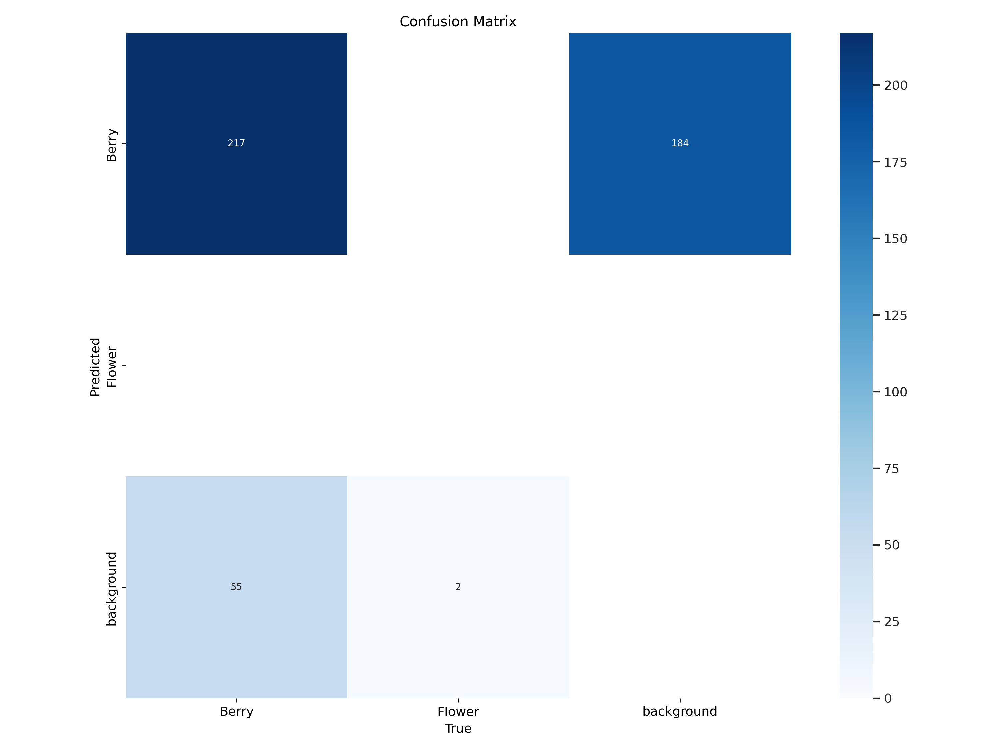

In [11]:
Image ("/content/runs/detect/train/confusion_matrix.png", width= 900)

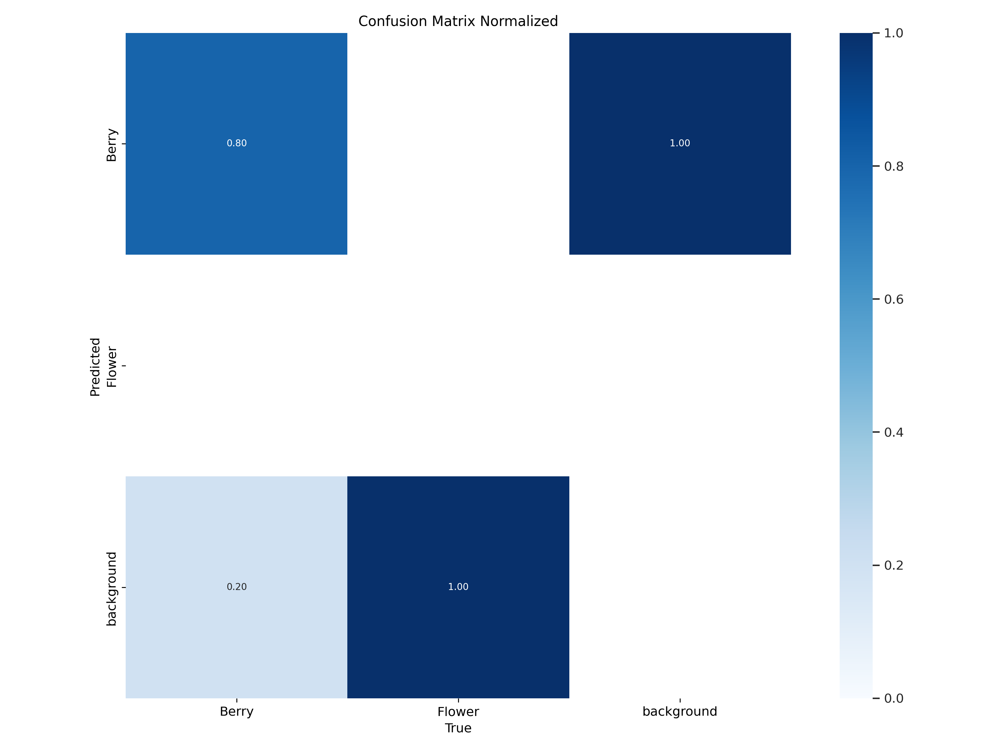

In [12]:
Image ("/content/runs/detect/train/confusion_matrix_normalized.png", width= 900)

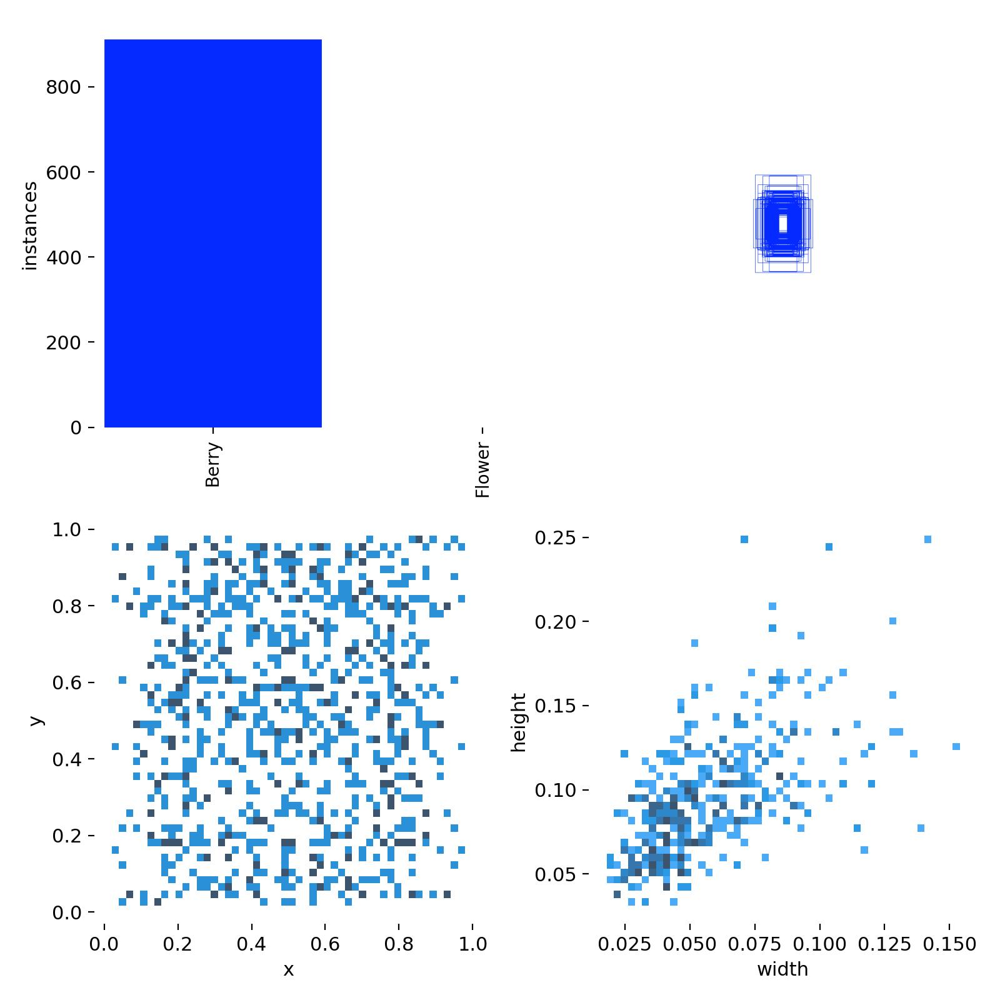

In [13]:
Image ("/content/runs/detect/train/labels.jpg", width= 900)

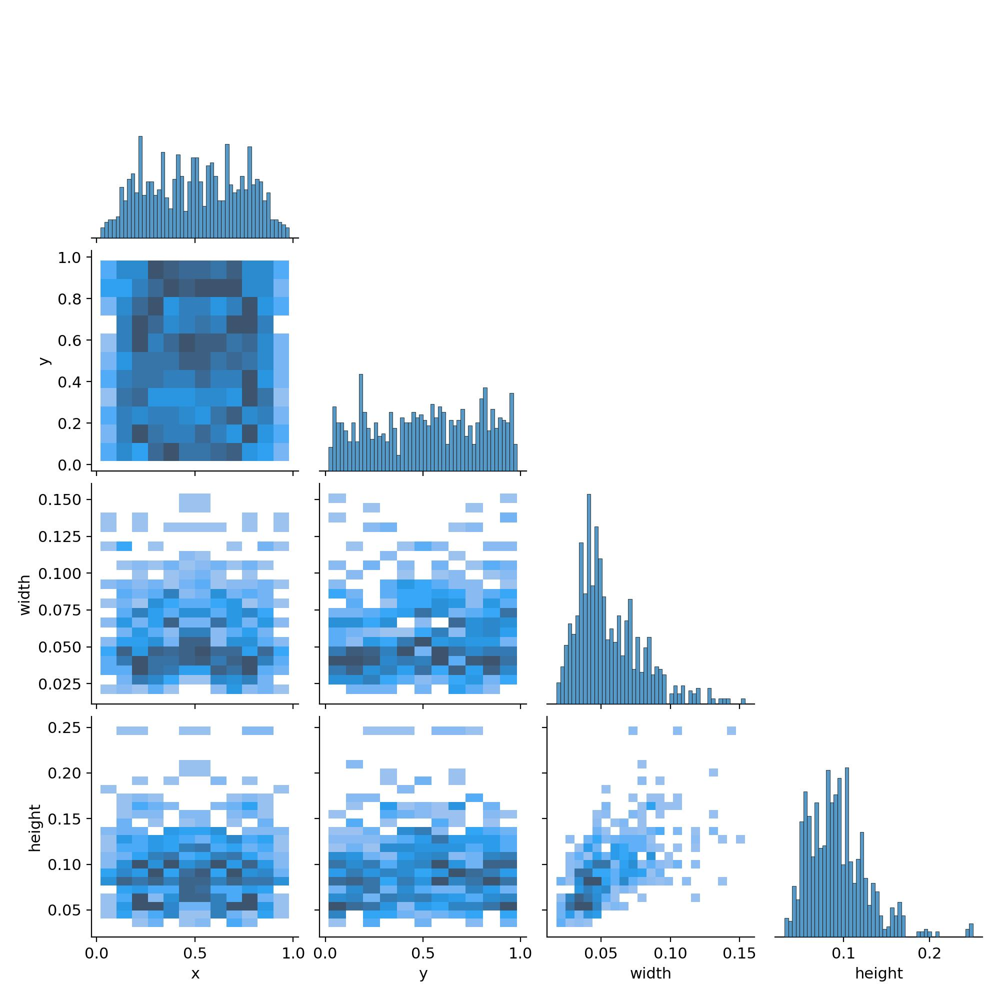

In [14]:
Image ("/content/runs/detect/train/labels_correlogram.jpg", width= 900)

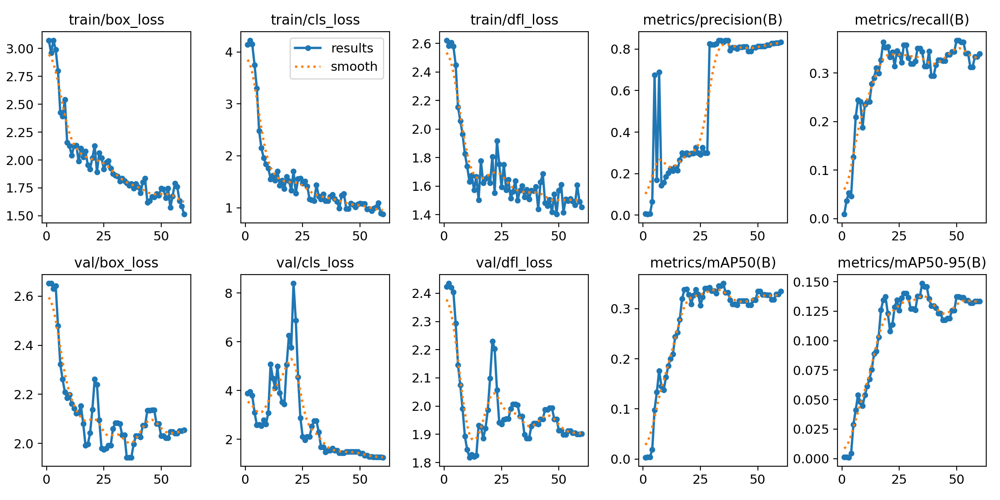

In [15]:
Image ("/content/runs/detect/train/results.png", width= 900)

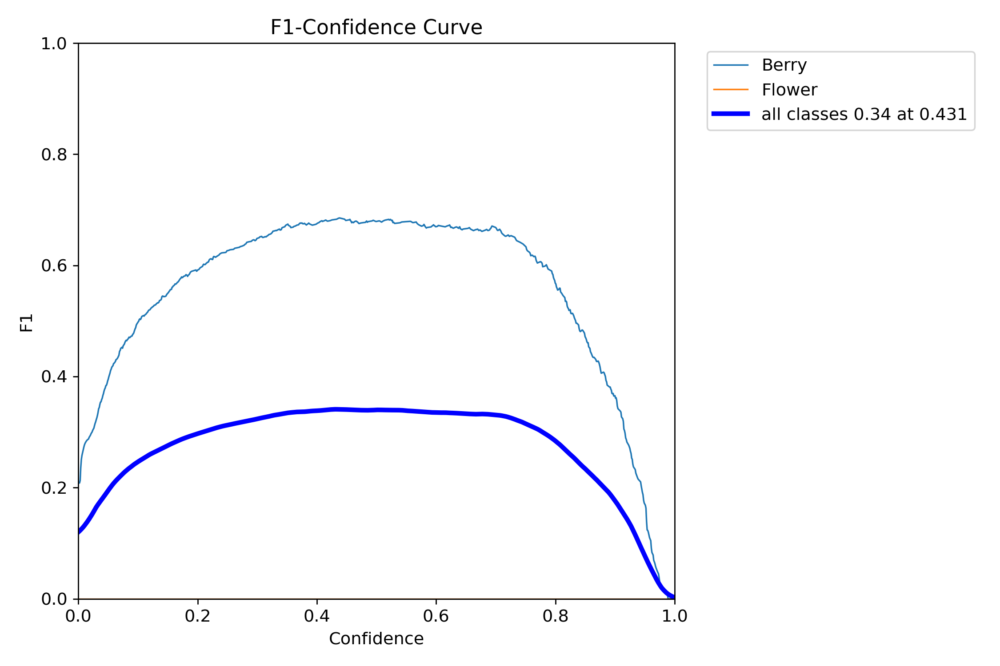

In [16]:
Image ("/content/runs/detect/train/F1_curve.png", width= 600)

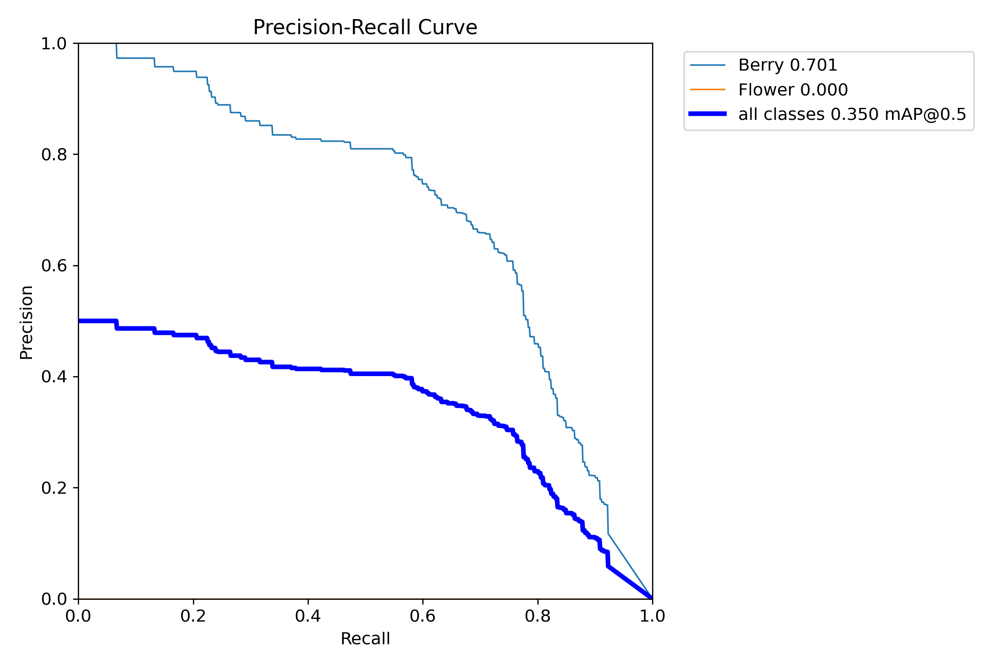

In [17]:
Image ("/content/runs/detect/train/PR_curve.png", width= 600)

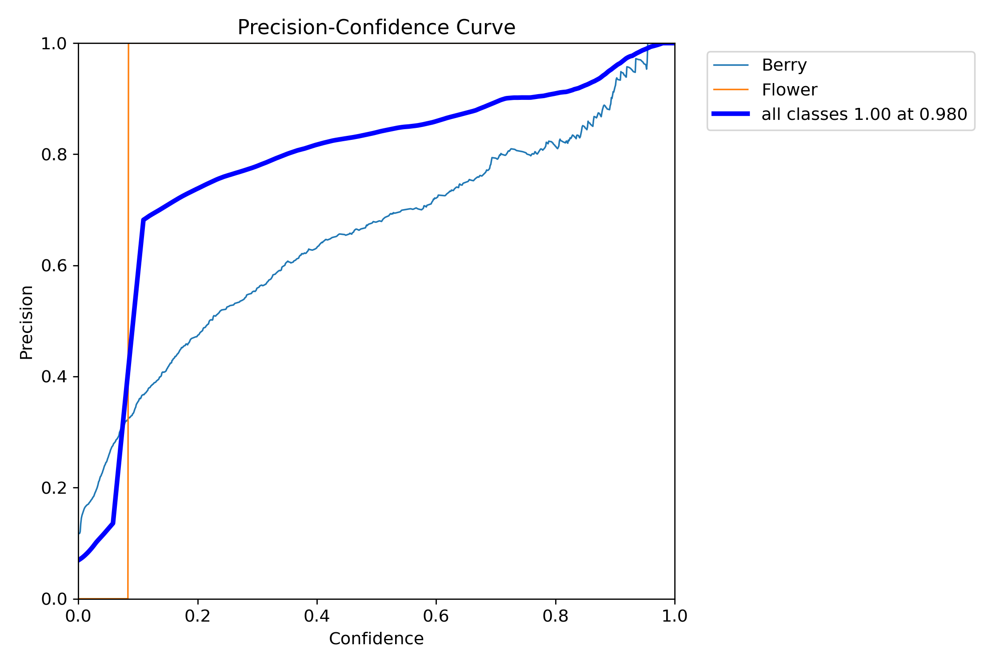

In [18]:
Image ("/content/runs/detect/train/P_curve.png", width= 600)

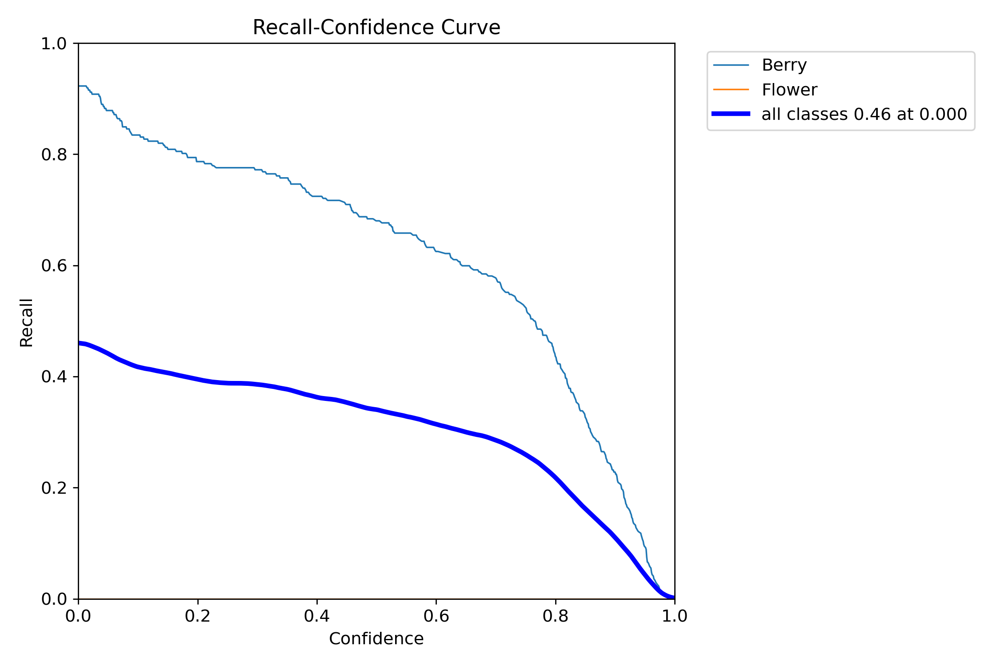

In [19]:
Image ("/content/runs/detect/train/R_curve.png", width= 600)

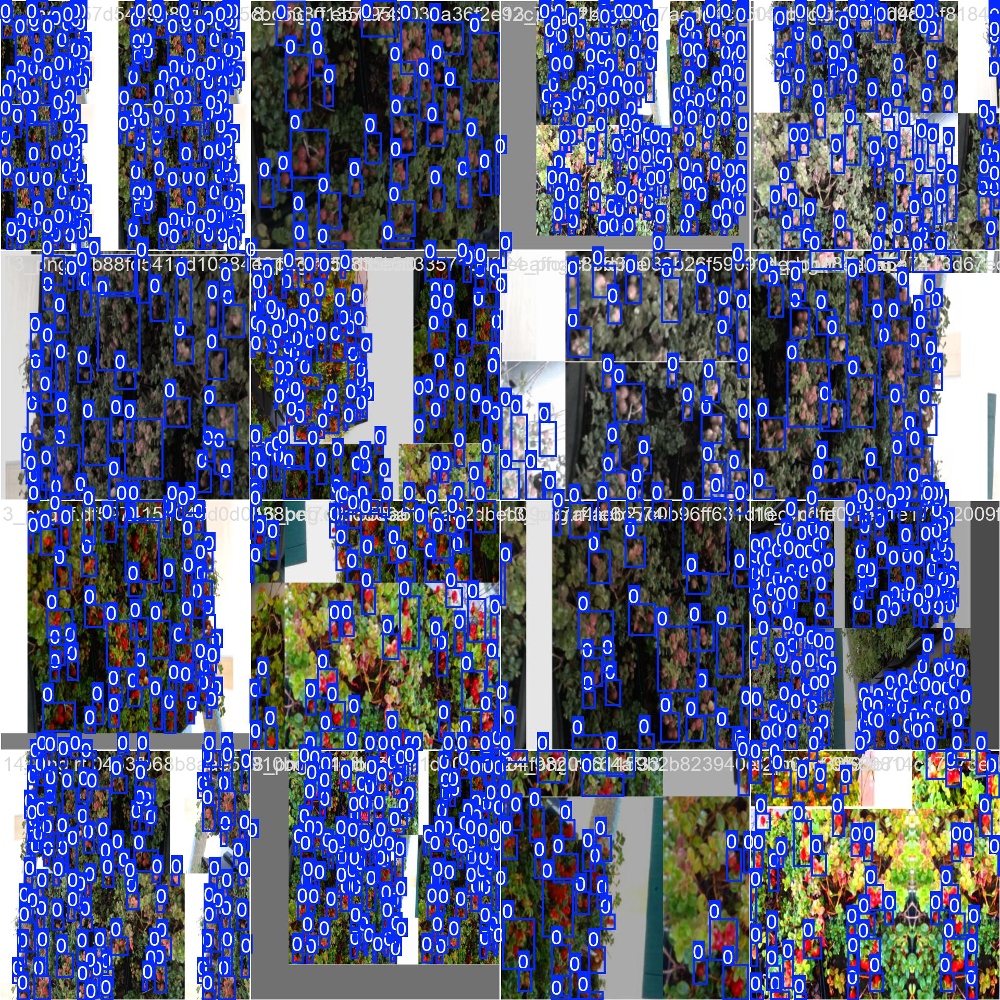

In [20]:
Image ("/content/runs/detect/train/train_batch0.jpg", width= 900)

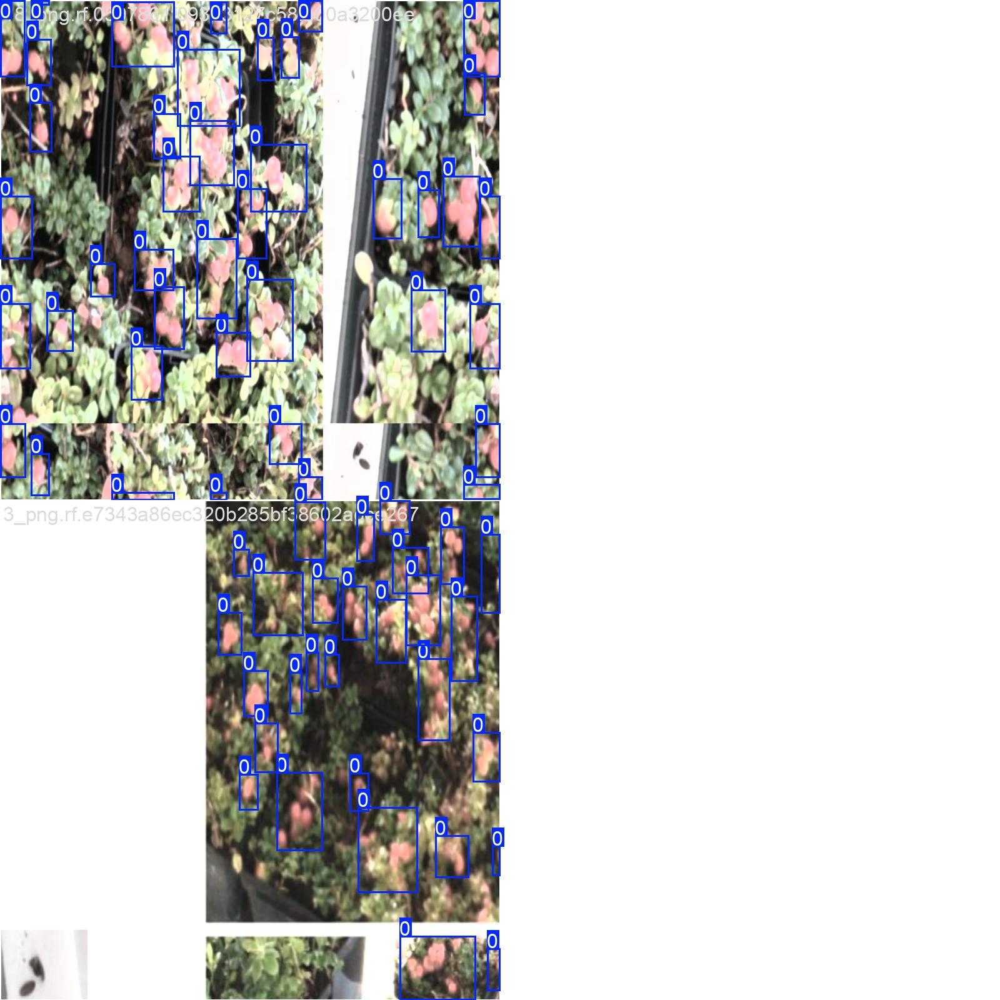

In [21]:
Image ("/content/runs/detect/train/train_batch1.jpg", width= 900)

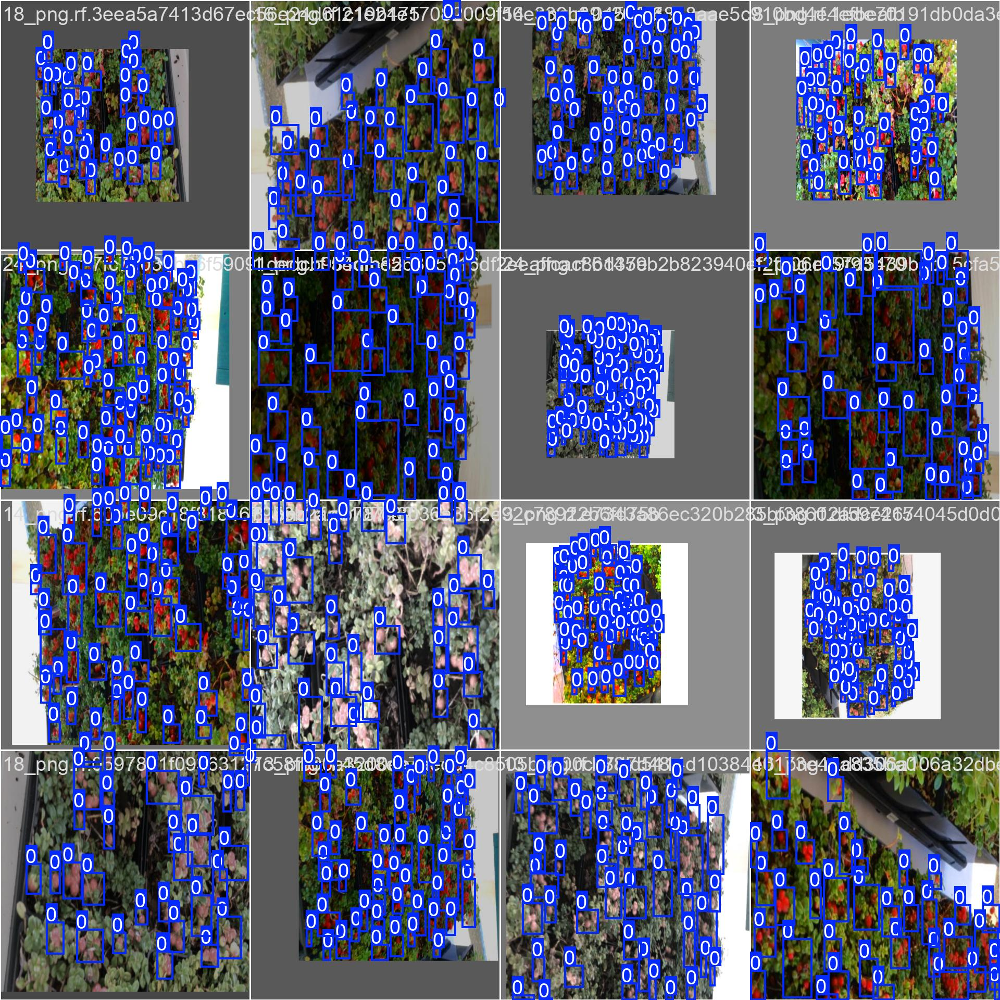

In [22]:
Image ("/content/runs/detect/train/train_batch100.jpg", width= 900)

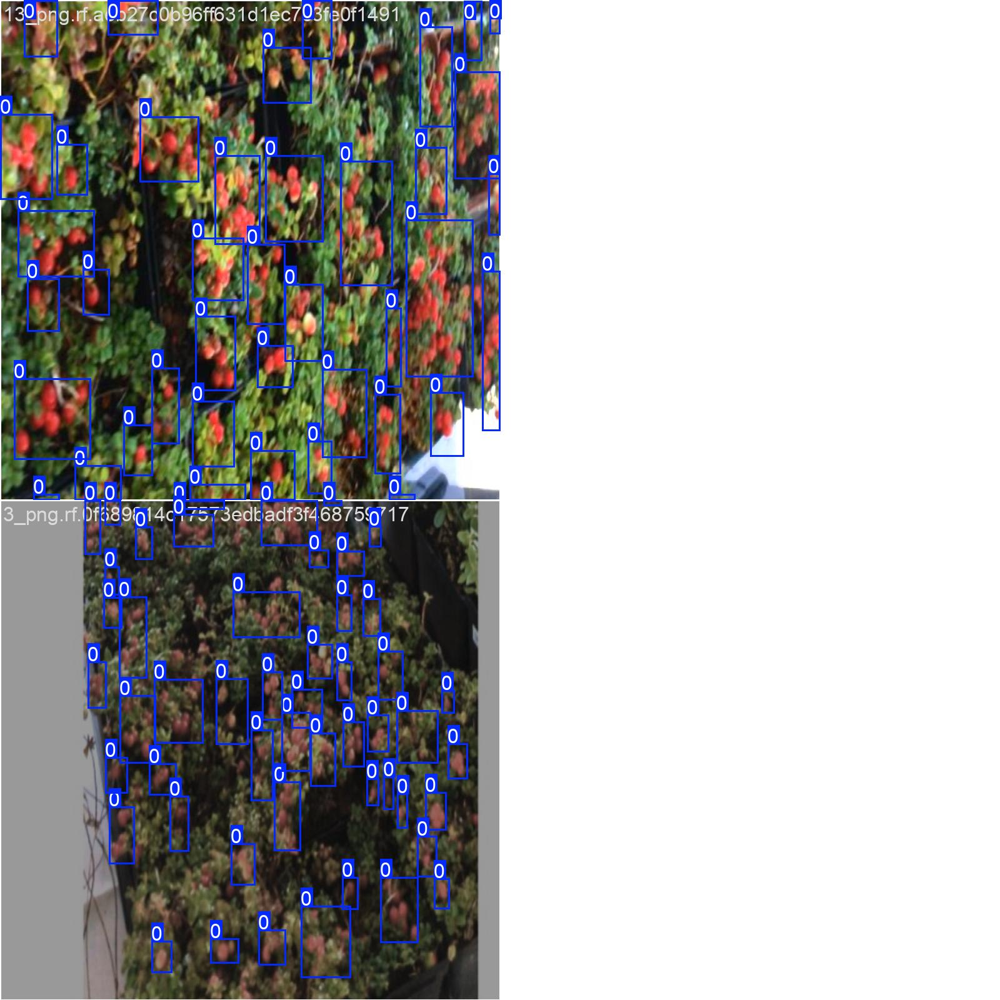

In [23]:
Image ("/content/runs/detect/train/train_batch101.jpg", width= 900)

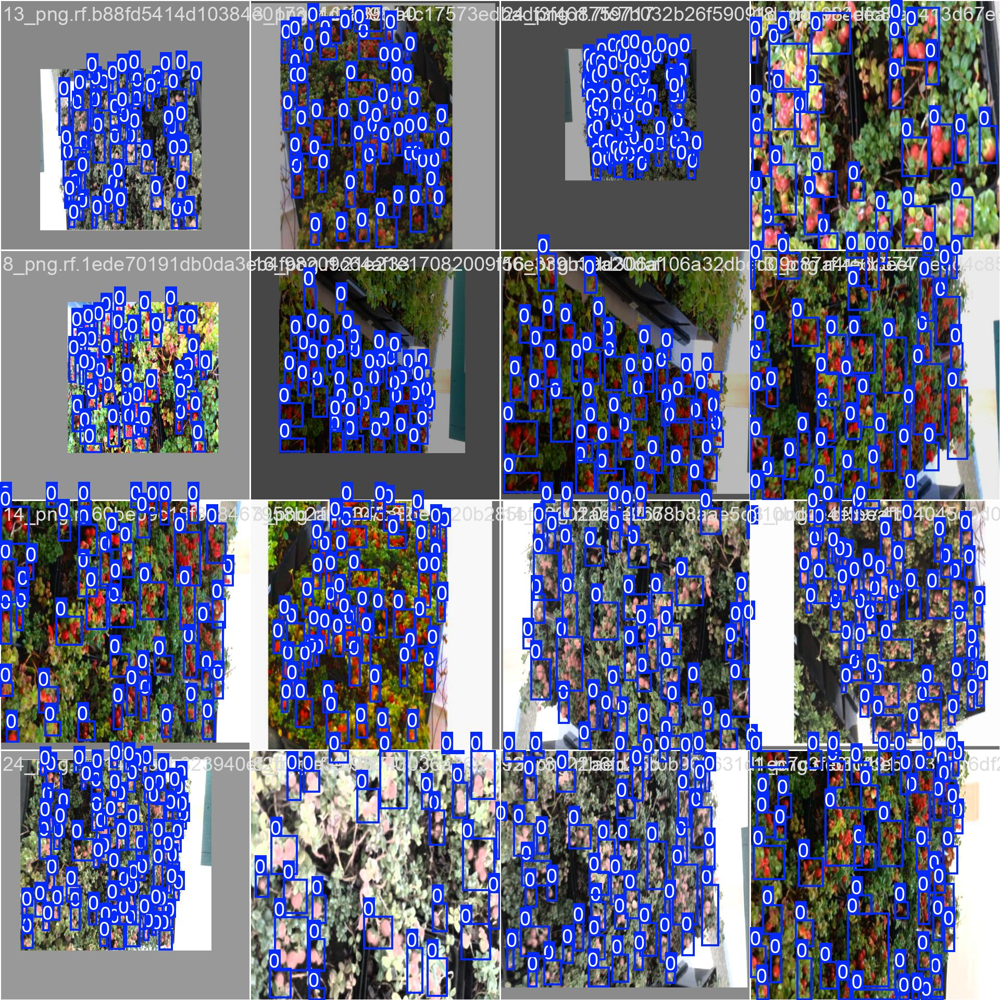

In [24]:
Image ("/content/runs/detect/train/train_batch102.jpg", width= 900)

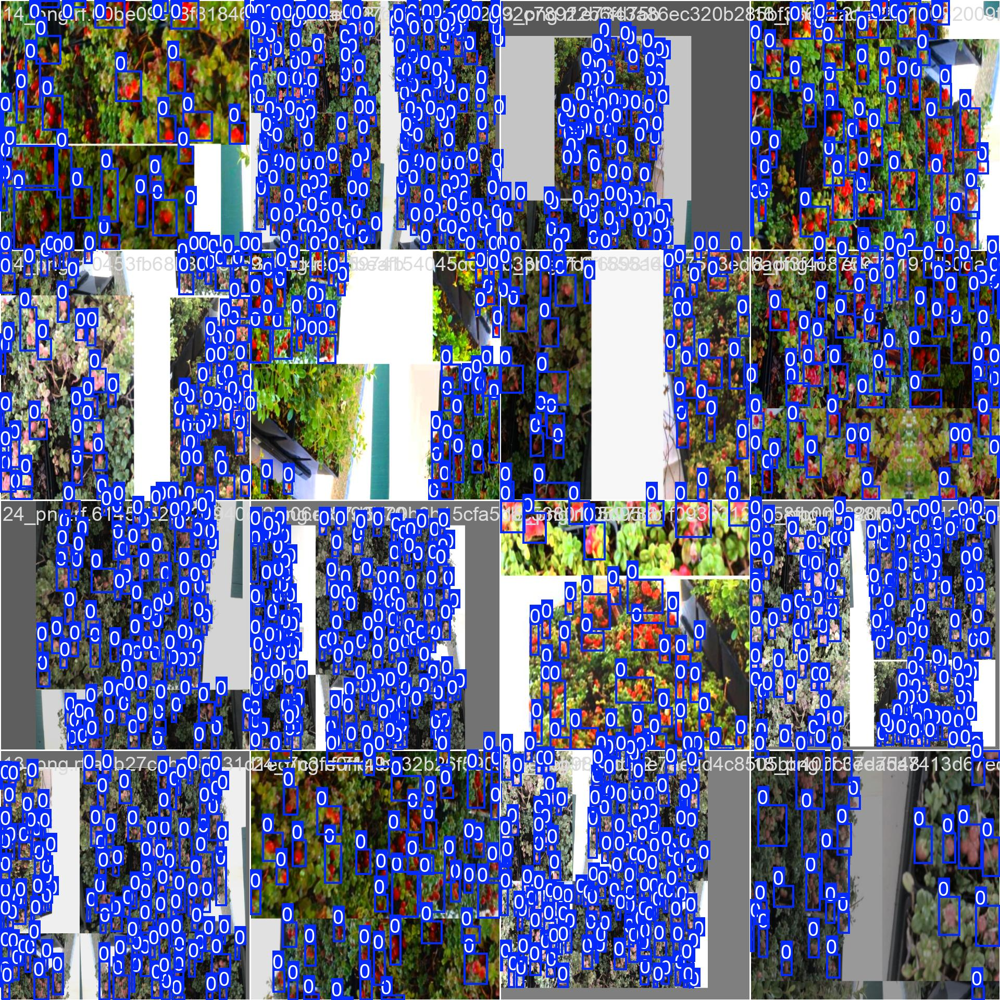

In [25]:
Image ("/content/runs/detect/train/train_batch2.jpg", width= 900)

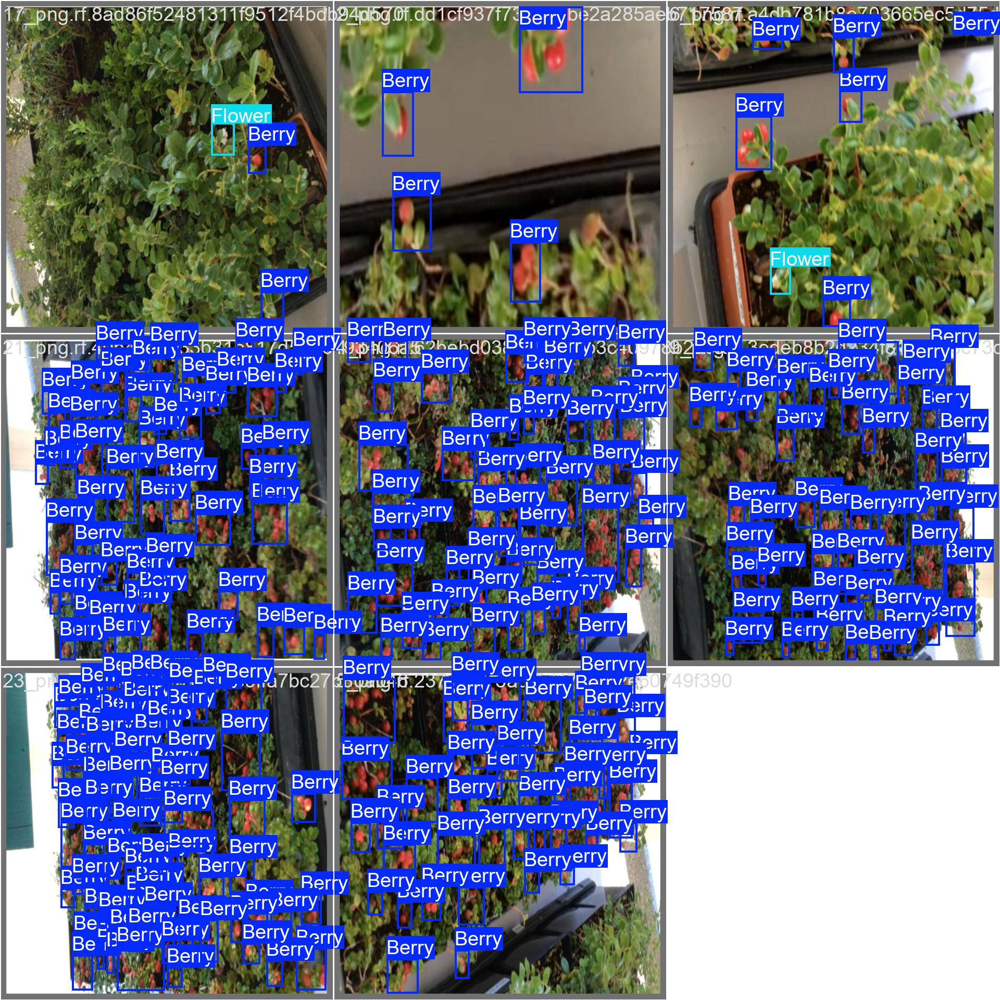

In [26]:
Image ("/content/runs/detect/train/val_batch0_labels.jpg", width= 900)

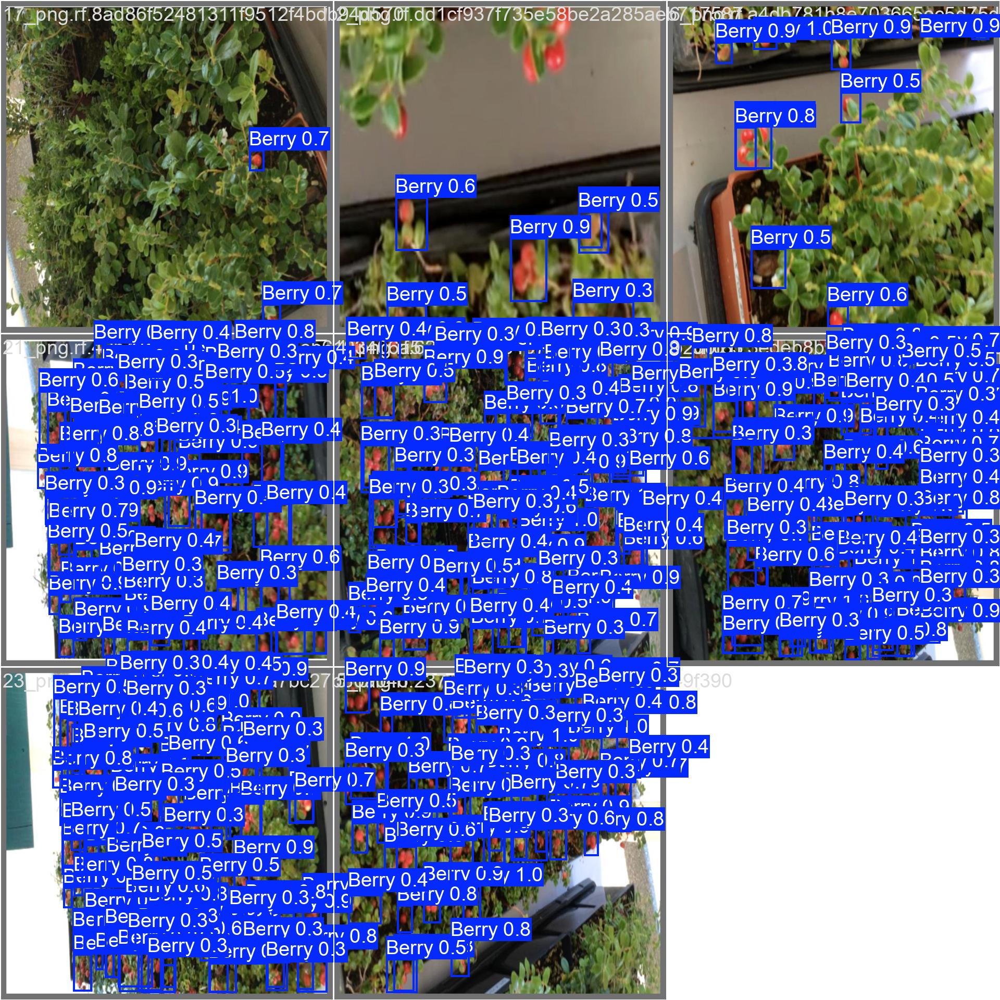

In [27]:
Image ("/content/runs/detect/train/val_batch0_pred.jpg", width= 900)

In [28]:
! yolo task=detect mode=val model="/content/runs/detect/train/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 197 layers, 7,167,862 parameters, 0 gradients, 26.7 GFLOPs
val: Scanning /content/Lingonberry-yield-prediction--1/valid/labels.cache... 8 images, 0 backgrounds, 0 corrupt: 100% 8/8 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  1.62it/s]
                   all          8        274      0.833      0.342      0.349      0.149
                 Berry          8        272      0.665      0.684      0.697      0.297
                Flower          2          2          1          0          0          0
Speed: 0.4ms preprocess, 23.4ms inference, 0.0ms loss, 30.0ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


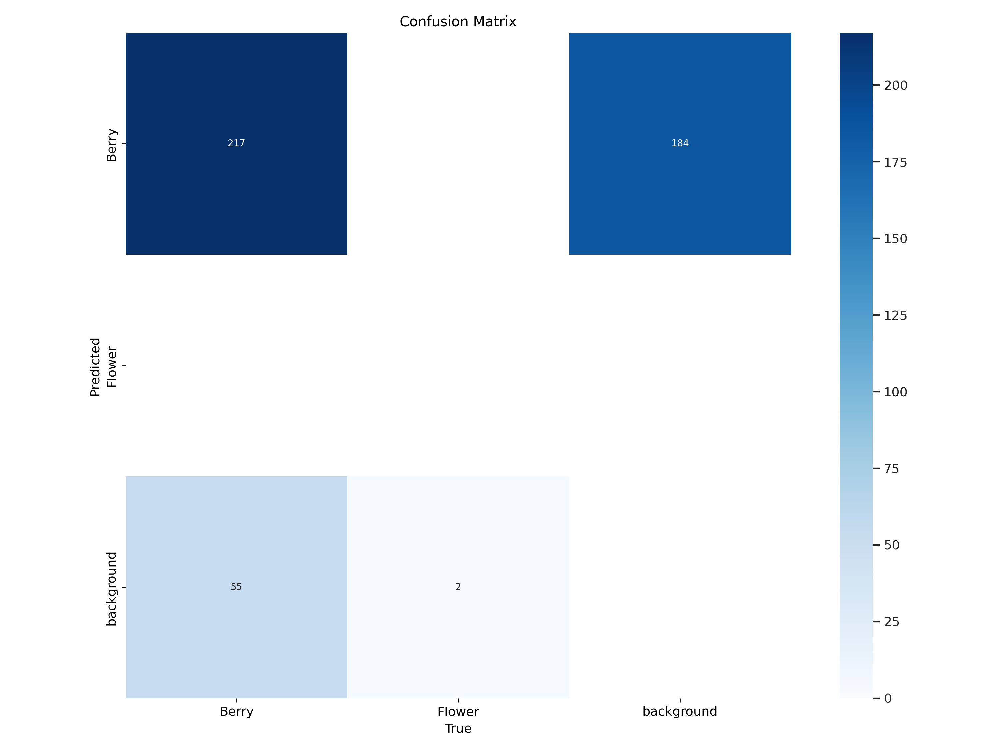

In [29]:
Image ("/content/runs/detect/val/confusion_matrix.png", width= 900)

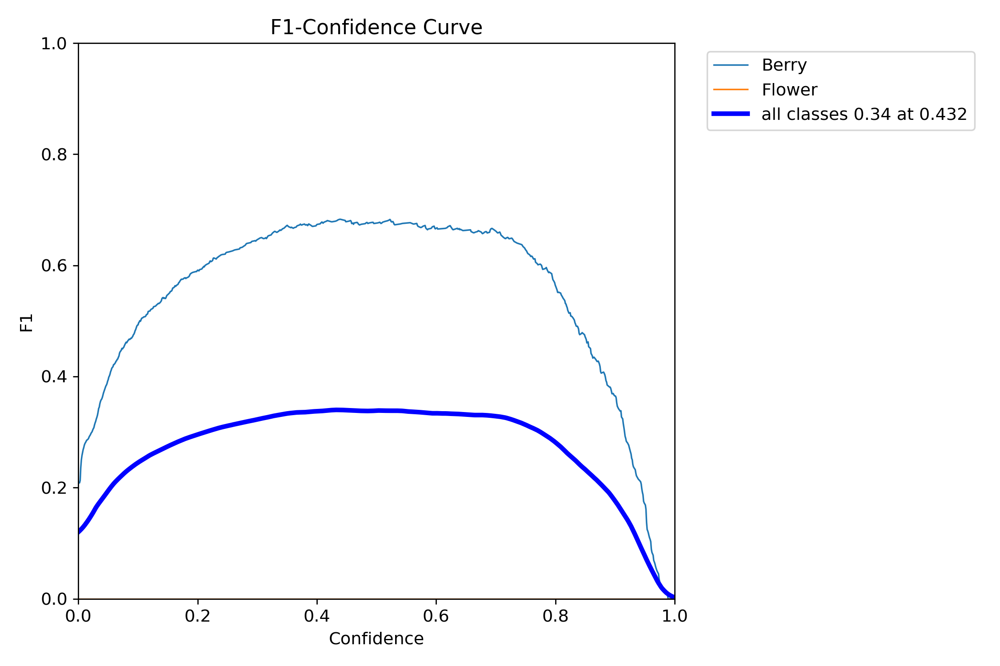

In [30]:
Image ("/content/runs/detect/val/F1_curve.png", width= 600)

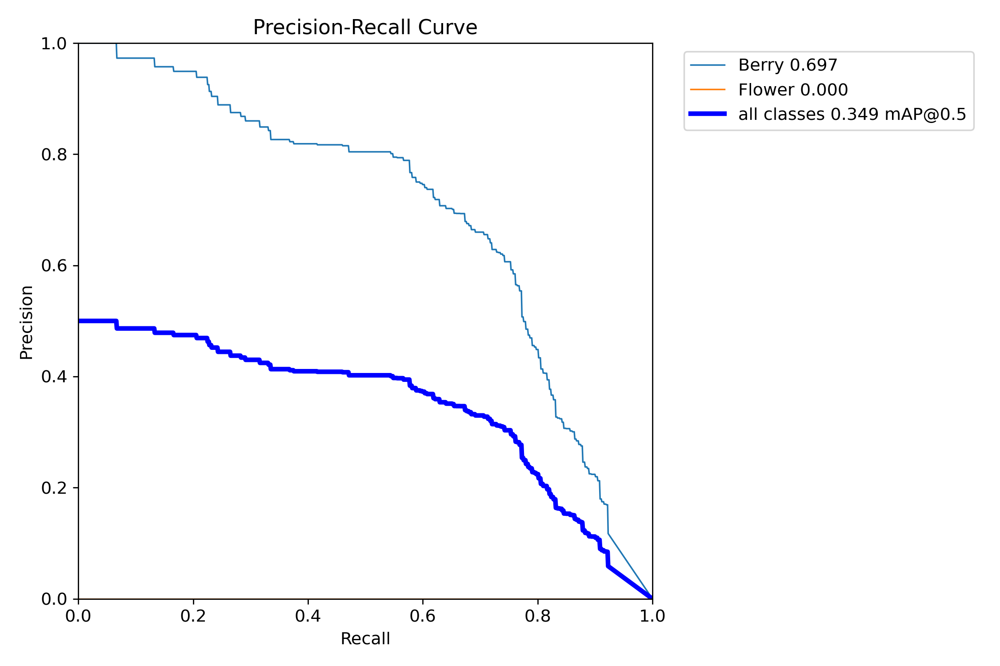

In [31]:
Image ("/content/runs/detect/val/PR_curve.png", width= 600)

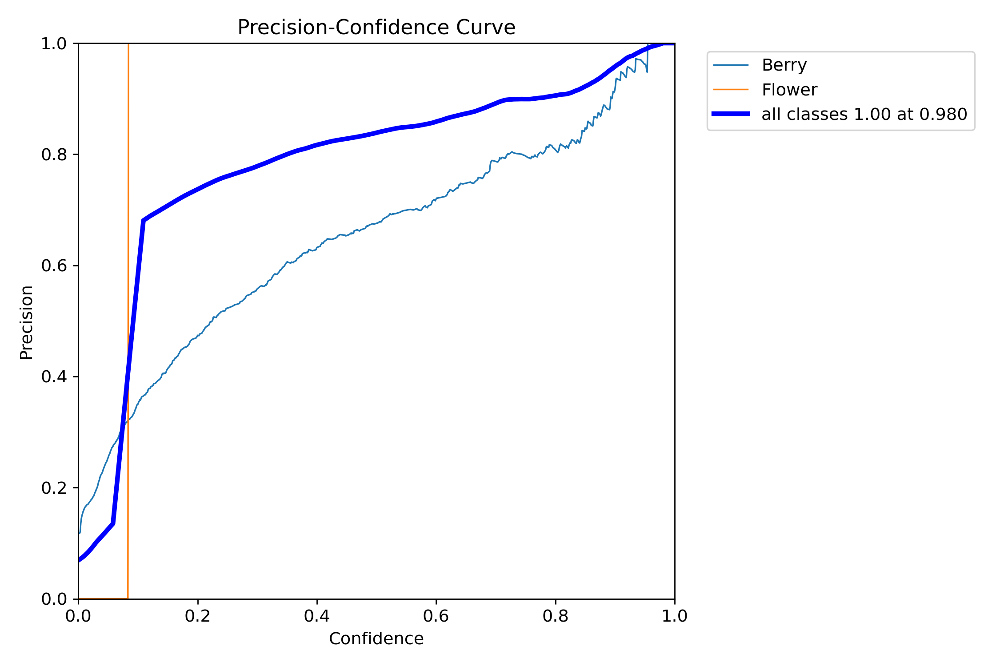

In [32]:
Image ("/content/runs/detect/val/P_curve.png", width= 600)

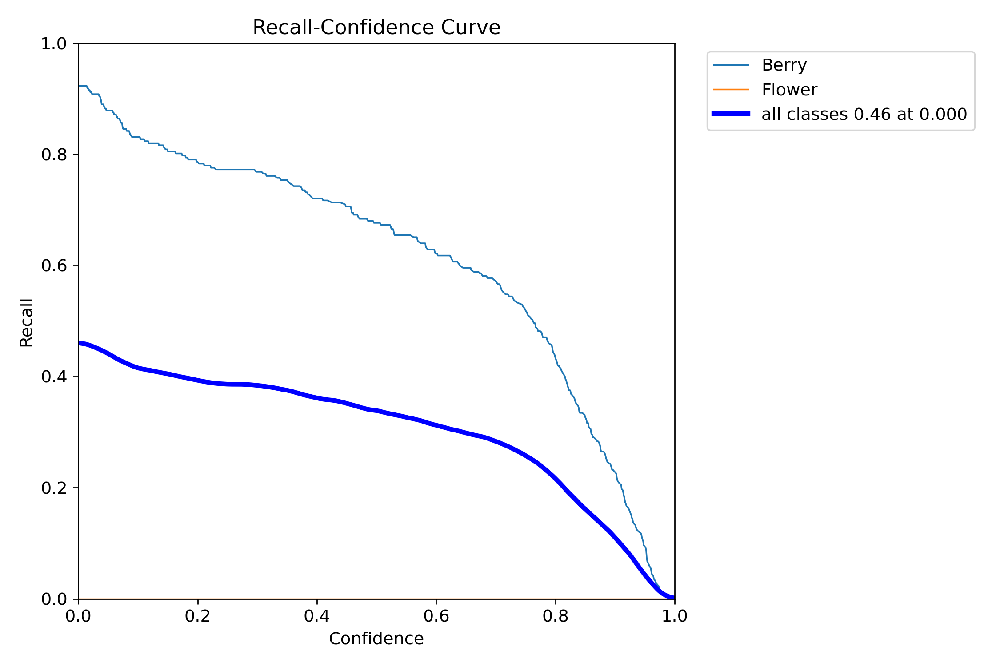

In [33]:
Image ("/content/runs/detect/val/R_curve.png", width= 600)

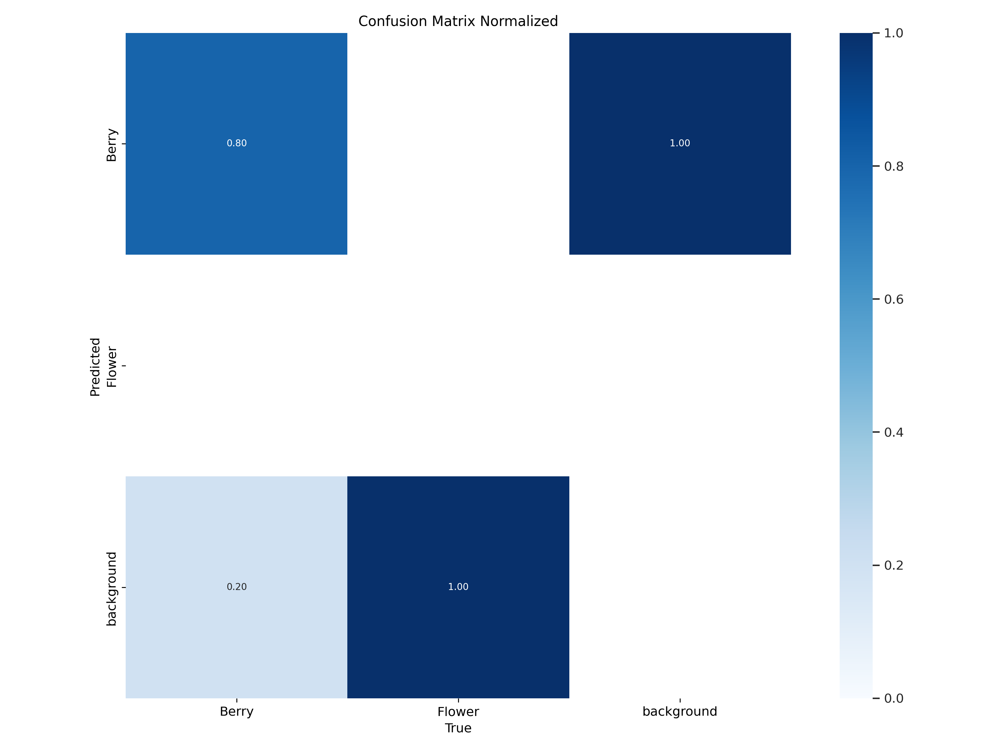

In [34]:
Image ("/content/runs/detect/val/confusion_matrix_normalized.png", width= 900)

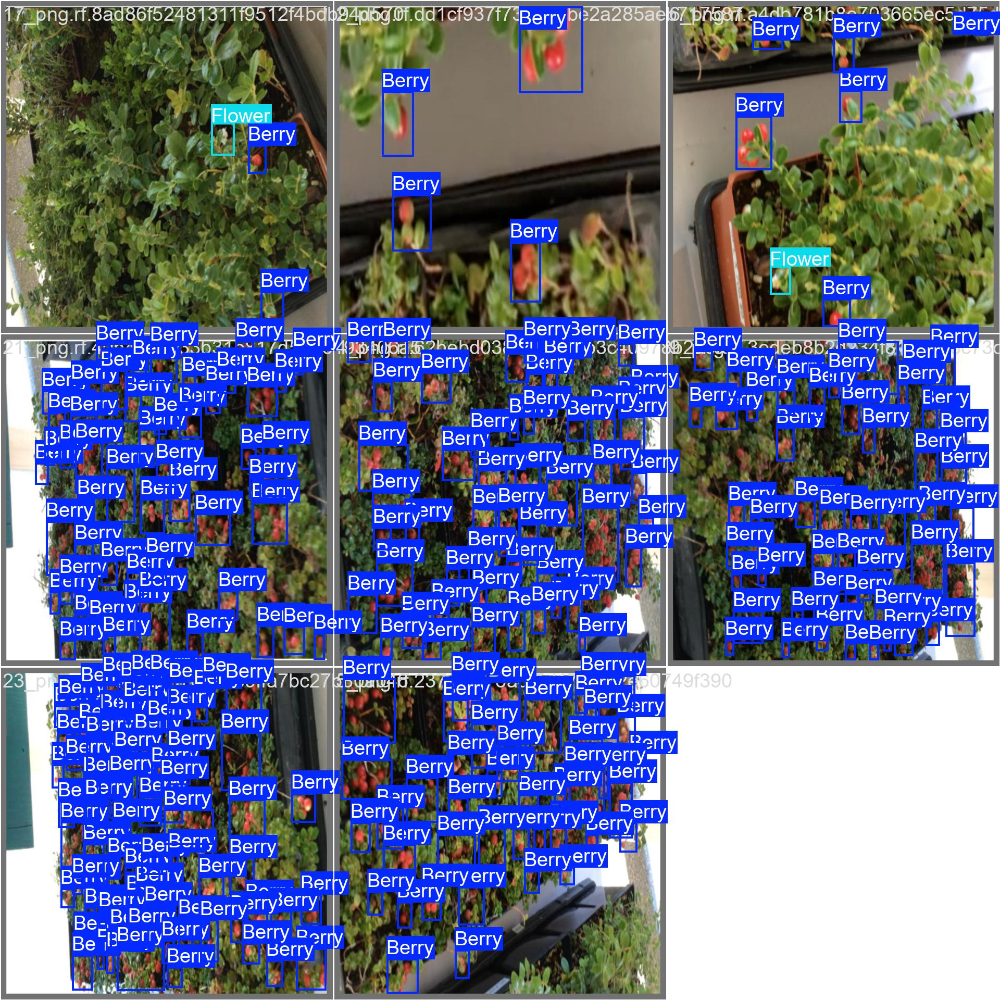

In [35]:
Image ("/content/runs/detect/val/val_batch0_labels.jpg", width= 900)

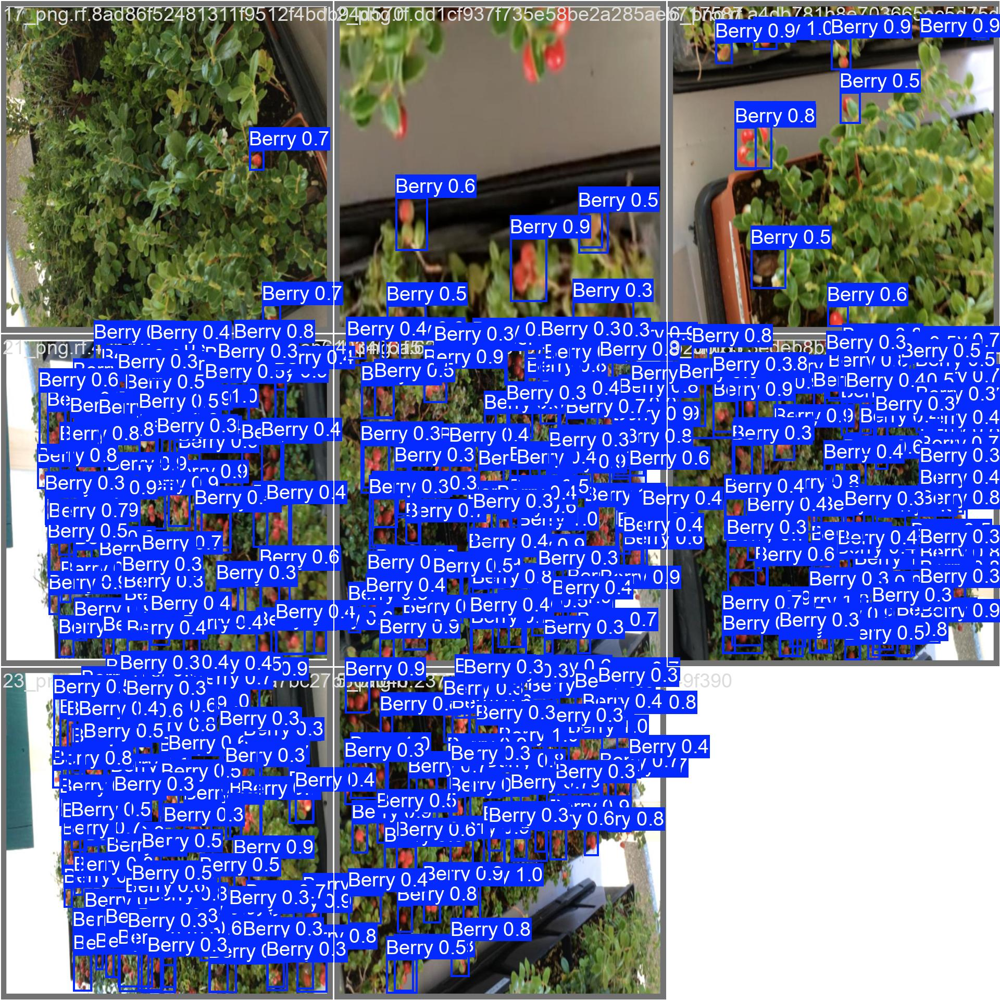

In [36]:
Image ("/content/runs/detect/val/val_batch0_pred.jpg", width= 900)

In [37]:
! yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 197 layers, 7,167,862 parameters, 0 gradients, 26.7 GFLOPs

image 1/8 /content/Lingonberry-yield-prediction--1/test/images/10_png.rf.88887124653ceac41cee57f375c750f2.jpg: 800x800 93 Berrys, 28.6ms
image 2/8 /content/Lingonberry-yield-prediction--1/test/images/11_png.rf.fbce987685d81690680b3b1dbdee8203.jpg: 800x800 77 Berrys, 28.7ms
image 3/8 /content/Lingonberry-yield-prediction--1/test/images/12_png.rf.e474b5119081983993dc9dfb651cc7aa.jpg: 800x800 95 Berrys, 28.6ms
image 4/8 /content/Lingonberry-yield-prediction--1/test/images/15_png.rf.ad776013f95c7aa4b554cee7e4f9d371.jpg: 800x800 59 Berrys, 28.6ms
image 5/8 /content/Lingonberry-yield-prediction--1/test/images/19_png.rf.30aac68d3b7a1250b86d951800015ae1.jpg: 800x800 59 Berrys, 28.7ms
image 6/8 /content/Lingonberry-yield-prediction--1/test/images/20_png.rf.ef79e4171d7703a3e7b97861e3bab510.jpg: 800x800 79 Berrys, 21.7ms
image 7/8 /

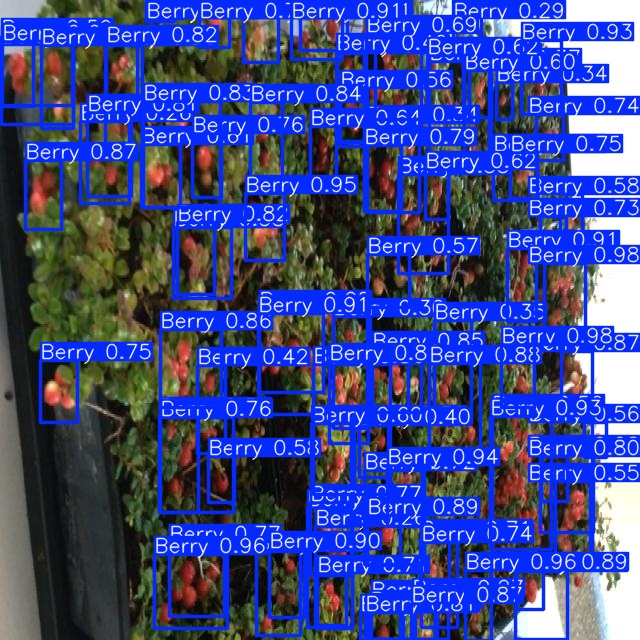

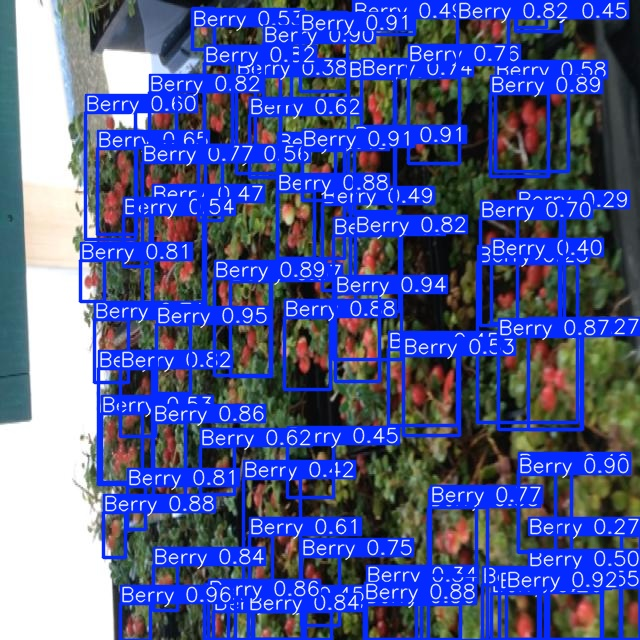

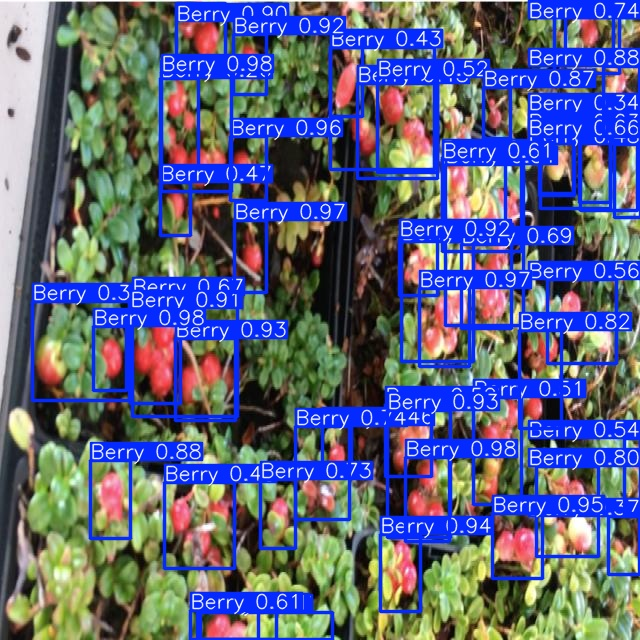

In [38]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
  display(IPyImage(filename=img, width=600))
  print("\n")

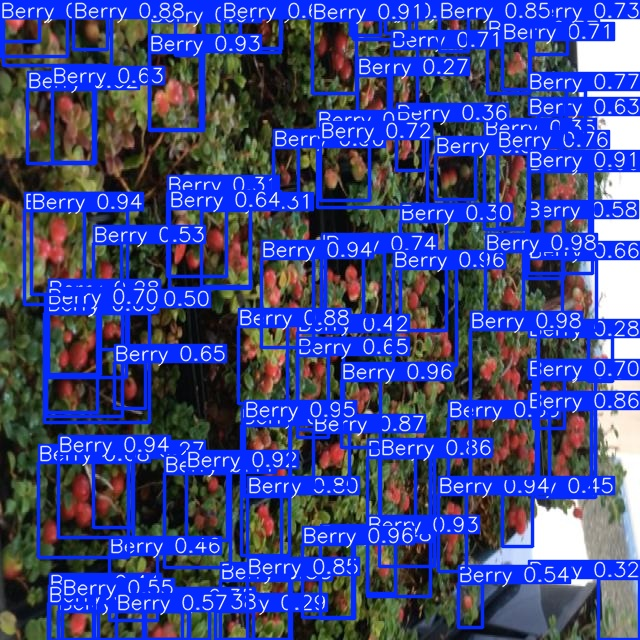

In [39]:
Image ("/content/runs/detect/predict/10_png.rf.88887124653ceac41cee57f375c750f2.jpg", width= 1200)

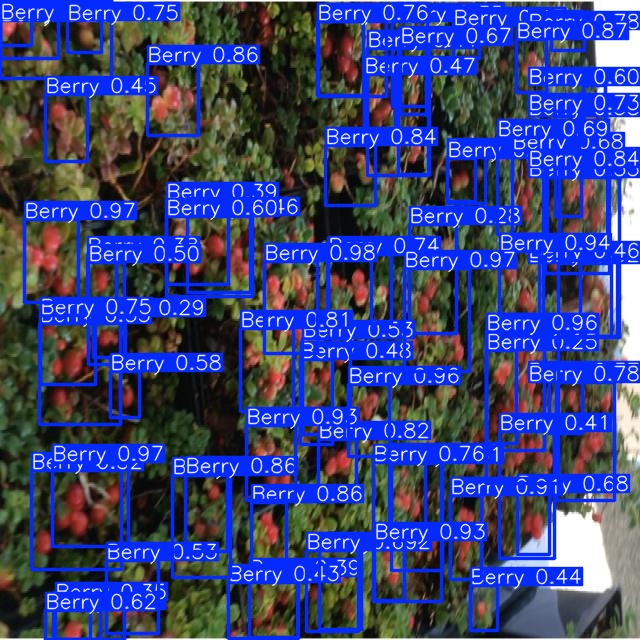

In [40]:
Image ("/content/runs/detect/predict/11_png.rf.fbce987685d81690680b3b1dbdee8203.jpg", width= 1200)

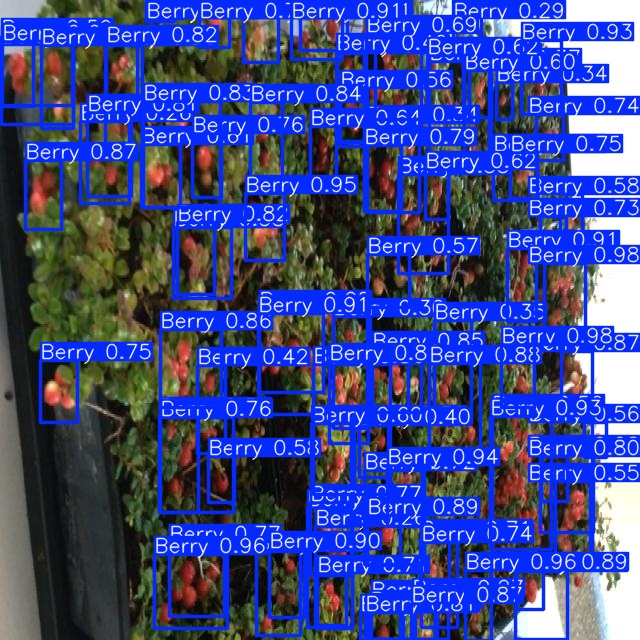

In [41]:
Image ("/content/runs/detect/predict/12_png.rf.e474b5119081983993dc9dfb651cc7aa.jpg", width= 1200)

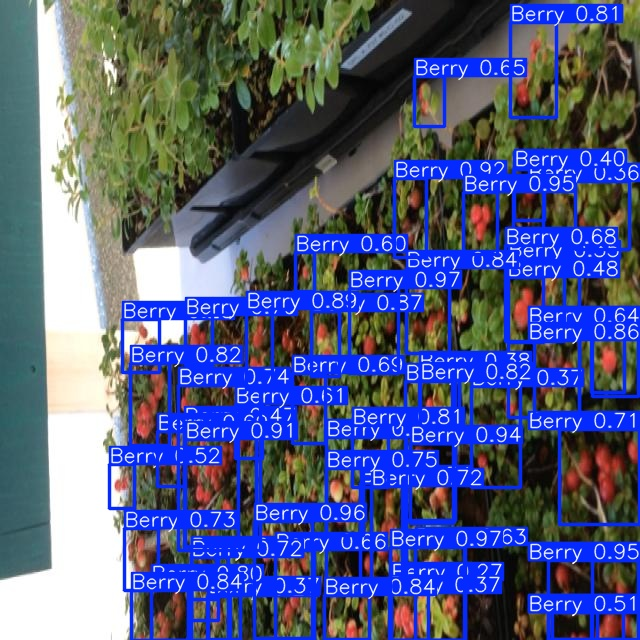

In [42]:
Image ("/content/runs/detect/predict/15_png.rf.ad776013f95c7aa4b554cee7e4f9d371.jpg", width= 1200)

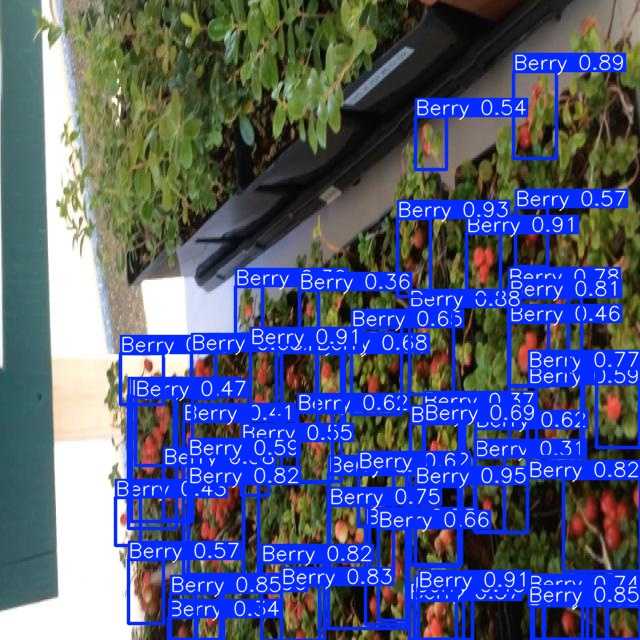

In [43]:
Image ("/content/runs/detect/predict/19_png.rf.30aac68d3b7a1250b86d951800015ae1.jpg", width= 1200)

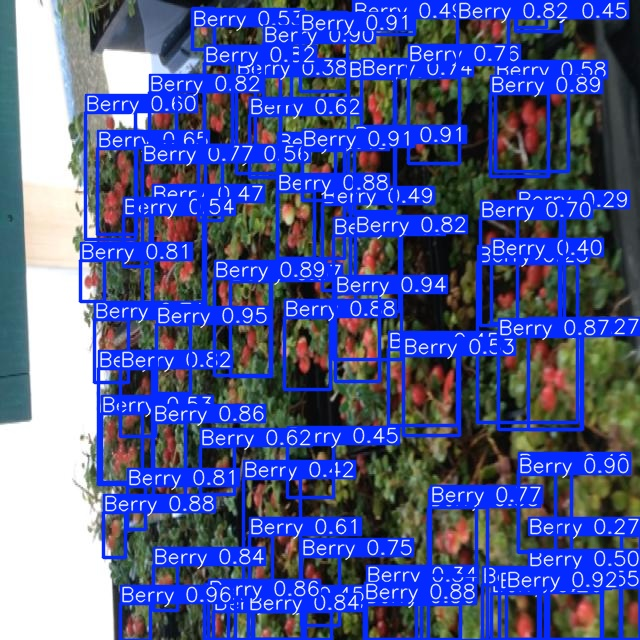

In [44]:
Image ("/content/runs/detect/predict/20_png.rf.ef79e4171d7703a3e7b97861e3bab510.jpg", width= 1200)

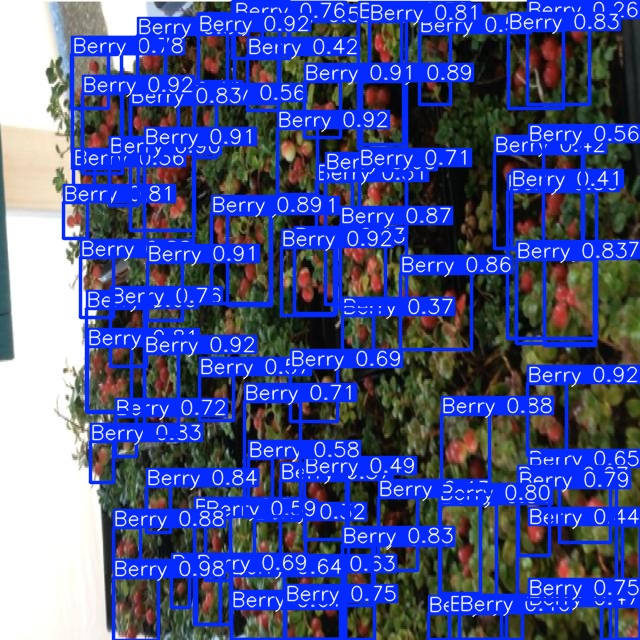

In [45]:
Image ("/content/runs/detect/predict/22_png.rf.e185f2c85d45a9dee84191ff7bb48f38.jpg", width= 1200)

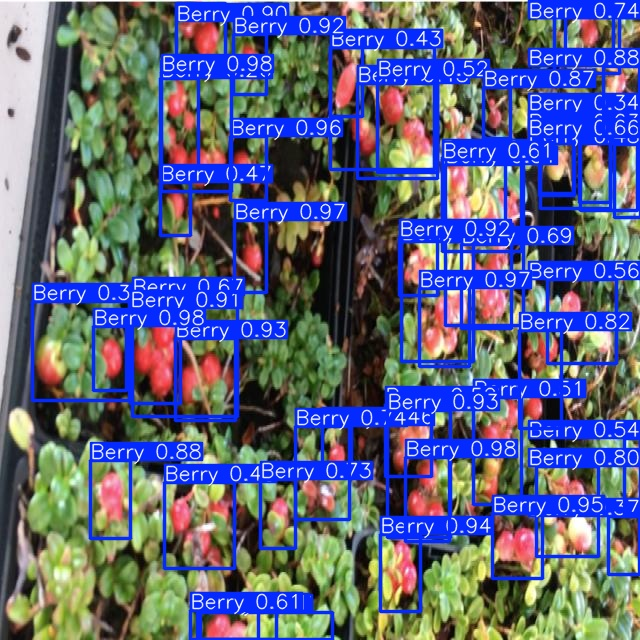

In [46]:
Image ("/content/runs/detect/predict/7_png.rf.ee85ad7c22f8287c480e9d7d80b3f41d.jpg", width= 1200)

In [49]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/12.png save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 197 layers, 7,167,862 parameters, 0 gradients, 26.7 GFLOPs

image 1/1 /content/drive/MyDrive/12.png: 480x800 107 Berrys, 23 Flowers, 51.3ms
Speed: 3.8ms preprocess, 51.3ms inference, 143.2ms postprocess per image at shape (1, 3, 480, 800)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


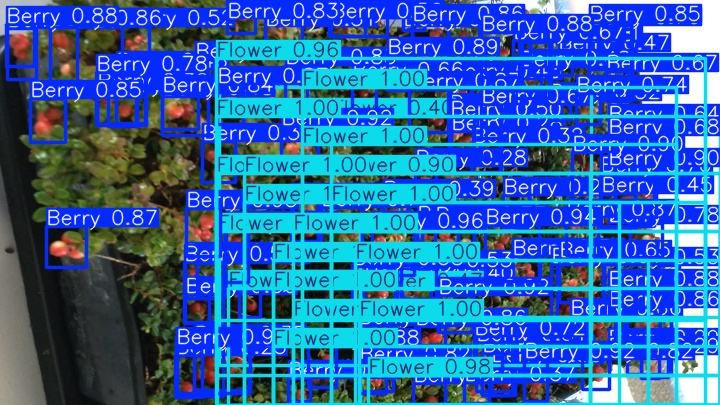

In [50]:
Image ("/content/runs/detect/predict3/12.jpg", width= 1200)

In [51]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source=/content/drive/MyDrive/17.png save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 197 layers, 7,167,862 parameters, 0 gradients, 26.7 GFLOPs

image 1/1 /content/drive/MyDrive/17.png: 480x800 3 Berrys, 54.8ms
Speed: 3.3ms preprocess, 54.8ms inference, 142.7ms postprocess per image at shape (1, 3, 480, 800)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


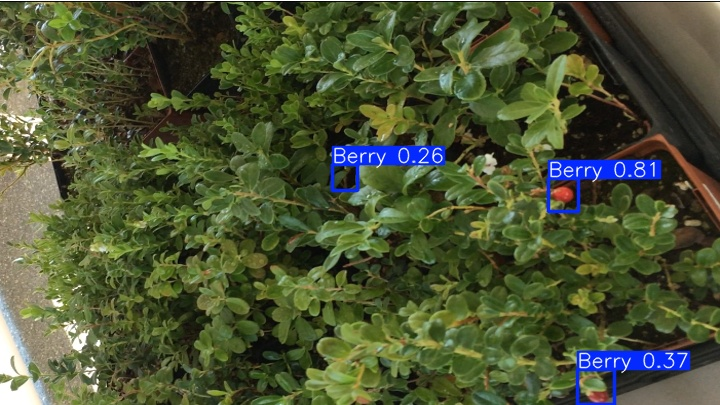

In [52]:
Image ("/content/runs/detect/predict4/17.jpg", width= 1200)

In [ ]:
# Thank you #